# Installing Libraries

In [ ]:
!pip install -q numpy pandas altair scikit-learn

이번 실습에서는 따로 설치할 라이브러리는 없다.

# Data Preparation

여러 군집화 알고리즘의 비교를 위해 임의의 데이터셋들을 만들어보자.

In [ ]:
from sklearn.datasets import make_blobs, make_moons, make_circles
import numpy as np
import altair as alt


# Gaussian Distribution을 따르는 데이터를 생성한다
BLOBS, _= make_blobs(
    n_samples=1500,
    n_features=2,
    centers=5, # 생성할 Gaussian Distribution 들의 개수를 의미한다.
    center_box=(-1, 1), # Gaussian Distribution의 중심(평균)의 범위를 의미한다.
    cluster_std=0.2, # Gaussian Distribution의 분산을 의미한다..#
    random_state=42,
)
BLOBS = pd.DataFrame(BLOBS, columns=['x1', 'x2'])

# 달 형태의 데이터를 생성한다
MOON, _= make_moons(
    n_samples=1500,
    noise=0.05,
    random_state=42
)
MOON = pd.DataFrame(MOON, columns=['x1', 'x2'])

# 도넛 형태의 데이터를 생성한다
DONUT, _ = make_circles(
    n_samples=1500,
    noise=0.05,
    factor=0.5,
    random_state=42
)
DONUT = pd.DataFrame(DONUT, columns=['x1', 'x2'])


# 무작위 데이터를 생성한다
rng = np.random.default_rng(42)
NO_STRUCT = rng.random((1500, 2)) * 2 - 1
NO_STRUCT = pd.DataFrame(NO_STRUCT, columns=['x1', 'x2'])

어떤 형태인지 다음과 같이 시각화해보자.

In [ ]:
import altair as alt


plots = []
for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    p = alt.Chart(data).mark_point(
        filled=True, opacity=0.5, size=50
    ).encode(
        x='x1', y='x2'
    ).properties(
        title=name,
        width=300,
        height=300
    )
    plots.append(p)

alt.hconcat(*plots)

alt.HConcatChart(...)

# K-Means

먼저, K-Means Clustering을 해보자. [sklearn.cluster.KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) 구현체를 활용하면 쉽게 사용해볼 수 있다.

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd


plots = []
for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    cluster = KMeans(
        n_clusters=5, # 5개의 군집을 만든다.
        init='random', # 초기 군집 중심을 무작위로 뽑는다.
        n_init=1, # 다중 시작 K-Means 대신 단 한번만 K-Means를 실행한다.
        tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
        max_iter=500, # 최대 반복 횟수를 의미한다 .
        random_state=42
    ).fit(data)
    label = cluster.predict(data)
    df_result = data.assign(
        cluster=label
    )
    df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])

    p_result = alt.Chart(df_result).mark_point(
        filled=True, opacity=0.5, size=50
    ).encode(
        x='x1', y='x2', color='cluster:N'
    ).properties(
        title=name
    )
    p_centroid = alt.Chart(df_centroid).mark_point(
        filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
    ).encode(
        x='x1', y='x2'
    )
    p = (p_result + p_centroid).properties(
        width=300,
        height=300
    )
    plots.append(p)

alt.hconcat(*plots)

alt.HConcatChart(...)

무작위로 군집 중심을 뽑는 것 대신, 우리가 직접 설정해볼 수도 있다. 초기 군집 중심에 따라 어떻게 결과가 바뀌는지 직접 확인해보자.

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    rng = np.random.default_rng(42)
    for _ in range(4):
        init_centroid = rng.random((5, 2)) * 2 - 1
        cluster = KMeans(
            n_clusters=5, # 5개의 군집을 만든다.
            init=init_centroid, # 직접 설정한 군집 중심을 최초 군집 중심으로 삼는다.
            n_init=1, # 다중 시작 K-Means 대신 단 한번만 K-Means를 실행한다.
            tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
            max_iter=500, # 최대 반복 횟수를 의미한다.
            random_state=42
        ).fit(data)
        label = cluster.predict(data)
        df_result = data.assign(
            cluster=label
        )
        df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])
        df_init = pd.DataFrame(init_centroid, columns=['x1', 'x2'])
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=name
        )
        p_centroid = alt.Chart(df_centroid).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
        ).encode(
            x='x1', y='x2'
        )
        p_init = alt.Chart(df_init).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='grey'
        ).encode(
            x='x1', y='x2'
        )
        p = (p_result + p_centroid + p_init).properties(
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)

서로 다른 초기 군집 중심에 따라 굉장히 서로 다른 형태의 군집들이 생성되는 것을 알 수 있다. 이런 단점을 개선하기 위한 방법을 사용해보자.

## 다중 시작 K-Means
여러 개의 초기 군집 중심으로 K-Means를 수행한 후 최종적으로 가장 낮은 관성 값을 가지는 결과를 취해보자. 별도의 구현은 필요없이, 단순히 **n_init**만 바꿔주면 된다.

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for i in range(4):
        cluster = KMeans(
            n_clusters=5, # 5개의 군집을 만든다.
            init='random', # 무작위로 초기 군집 중심을 뽑는다.
            n_init=10, # 총 10 회의 K-Means를 수행해서 가장 나은 관성값을 가지는 결과를 취한다.
            tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
            max_iter=500, # 최대 반복 횟수를 의미한다.
            random_state=42 + i # 다른 랜덤 시드를 비교해보자.
        ).fit(data)
        label = cluster.predict(data)
        df_result = data.assign(
            cluster=label
        )
        df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=f'{name} (seed = {42 + i})'
        )
        p_centroid = alt.Chart(df_centroid).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
        ).encode(
            x='x1', y='x2'
        )
        p = (p_result + p_centroid).properties(
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)

서로 다른 랜덤 시드에 따라서 조금씩 차이가 있지만, 대체적으로 굉장히 유사한 군집화 결과가 도출됨을 알 수 있다.

## K-Means++

이번에는 초기 군집 중심이 서로 멀리 떨어지도록 선택하는 K-Means++를 해보자. 이 또한 별도의 구현 없이 **init** 초매개변수를 **k-means++**로 바꿔주기만 하면 된다.

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for i in range(4):
        cluster = KMeans(
            n_clusters=5, # 5개의 군집을 만든다.
            init='k-means++', # K-Means++ 알고리즘을 적용해서 초기 군집 중심을 선택한다.
            n_init=1, # K-Means++ 라면 굳이 여러번 군집 중심을 뽑을 필요가 없으니 1로 바꾸자.
            tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
            max_iter=500, # 최대 반복 횟수를 의미한다.
            random_state=42 + i # 다른 랜덤 시드를 비교해보자.
        ).fit(data)
        label = cluster.predict(data)
        df_result = data.assign(
            cluster=label
        )
        df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=f'{name} (seed = {42 + i})'
        )
        p_centroid = alt.Chart(df_centroid).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
        ).encode(
            x='x1', y='x2'
        )
        p = (p_result + p_centroid).properties(
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)

역시 서로 다른 랜덤 시드에 따라서 조금씩 차이가 있지만, 대체적으로 굉장히 유사한 군집화 결과가 도출됨을 알 수 있다. 또한, 느꼈을지 모르겠지만, 다중 시작 K-Means보다 실행시간이 더 짧다!

## Elbow Method

이번엔 최적의 군집 수를 찾기 위한 방법 중 하나인 Elbow Method를 해보자. 방법은 간단하다. 여러 **k**에 대해서 K-Means를 훈련시킨 후에, 관성값을 계산해서 그려보면 된다. 이번 실습에서는 **BLOBS** 데이터에 대해서만 해보겠다.

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np


plots, inertia = [], []
for k in range(2, 10):
    cluster = KMeans(
        n_clusters=k, # k개의 군집을 만든다.
        init='k-means++', # K-Means++ 알고리즘을 적용해서 초기 군집 중심을 선택한다.
        n_init=1, # K-Means++ 라면 굳이 여러번 군집 중심을 뽑을 필요가 없으니 1로 바꾸자.
        tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
        max_iter=500, # 최대 반복 횟수를 의미한다.
        random_state=42
    ).fit(BLOBS)
    label = cluster.predict(BLOBS)
    df_result = BLOBS.assign(
        cluster=label
    )
    df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])
    p_result = alt.Chart(df_result).mark_point(
        filled=True, opacity=0.5, size=50
    ).encode(
        x='x1', y='x2', color='cluster:N'
    ).properties(
        title=f'k = {k}'
    )
    p_centroid = alt.Chart(df_centroid).mark_point(
        filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
    ).encode(
        x='x1', y='x2'
    )
    p = (p_result + p_centroid).properties(
        width=300,
        height=300
    )
    plots.append(p)
    inertia.append((k, cluster.inertia_)) # 최종 관성값은 다음과 같이 inertia_ 속성에 저장되어 있다.

p_cluster = alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
)
df = pd.DataFrame(inertia, columns=['k', 'inertia'])
p_inertia = alt.Chart(df).mark_line().encode(
    x='k:O', y='inertia:Q'
).properties(
    width=600
)
display(p_inertia)
display(p_cluster)

alt.Chart(...)

alt.VConcatChart(...)

보다시피, k = 3 또는 k = 4 정도가 좋은 선택으로 보인다.

## Silhouette Analysis
또 다른 방법으로, 군집 내 거리와 군집 간 거리를 고려하는 Silhouette Analysis를 해보자. 배운 공식대로 굳이 구현할 필요는 없고, [sklearn.metrics.silhouette_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score)로 전체 샘플의 Silhouette Coefficient의 평균, [sklearn.metrics.silhouette_samples](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_samples.html#sklearn.metrics.silhouette_samples)로 각 샘플의 Silhouette Coefficient를 구할 수 있다.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import pandas as pd
import numpy as np


plots, inertia = [], []
for k in range(2, 10):
    cluster = KMeans(
        n_clusters=k, # k개의 군집을 만든다.
        init='k-means++', # K-Means++ 알고리즘을 적용해서 초기 군집 중심을 선택한다.
        n_init=1, # K-Means++ 라면 굳이 여러번 군집 중심을 뽑을 필요가 없으니 1로 바꾸자.
        tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
        max_iter=500, # 최대 반복 횟수를 의미한다.
        random_state=42
    ).fit(BLOBS)
    label = cluster.predict(BLOBS)
    sil_avg = silhouette_score(BLOBS, label)
    sil_samples = silhouette_samples(BLOBS, label)
    df_sil = pd.DataFrame({
        'sil_coeff': sil_samples,
        'cluster': label
    }).sort_values(['cluster', 'sil_coeff']).assign(
        index=np.arange(len(label))
    )
    p_sil = alt.Chart(df_sil).mark_bar(size=1).encode(
        x='index:Q', y='sil_coeff:Q', color='cluster:N'
    )
    p_avg = alt.Chart().mark_rule(color='red', strokeWidth=2, strokeDash=(8, 4)).encode(
        y=alt.datum(sil_avg)
    )
    p = (p_sil + p_avg).properties(
        title=f'k = {k}',
        width=300,
        height=300
    )
    plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8])
)

alt.VConcatChart(...)

보다시피 k = 2일때는 Silhouetee Coeff.가 음수가 되는 샘플이 존재한다. 그 외에는 모두 평균보다 좋아 보인다. 이 중, 군집의 크기가 그나마 균등한 k = 4가 가장 좋은 선택인 것 같다.

#  Agglomerative Clustering
이번엔 하위 군집을 묶어서 상위 군집을 만드는 Hierachical Clustering을 해보자. 먼저 Bottom-Up 방식으로 군집화를 수행하는 Agglomerative Clustering이다. scikit-learn에서는 [sklearn.cluster.AgglomerativeClustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering)에 구현되어 있다.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import pandas as pd


plots = []
for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for linkage in ['single', 'average', 'complete', 'ward']:
        label = AgglomerativeClustering(
            n_clusters=2, # 2개의 군집을 만든다.
            metric='euclidean', # 두 샘플의 거리를 측정하는 데 Euclidean Distance를 활용한다.
                                # 원한다면 자신이 자신이 구현한 거리 측정 함수를 직접 넣을 수도 있다.
            linkage=linkage, # 묶을 두 군집을 선택하는 방법을 의미한다
        ).fit_predict(data)
        df_result = data.assign(
            cluster=label
        )
        p = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=f'{name} (Linkage = {linkage})',
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)

보다 시피 Single Linkage의 경우는 굉장히 이상한 군집화 결과를 나타내는 것을 알 수 있다. 보통은 Ward Linkage가 가장 선호된다. 다만, Ward Linkage의 경우 오직 Euclidean Distance에만 적용될 수 있다. 만약에 별도의 거리 측정치를 쓴다면 Complete 또는 Average Linkage를 고려하는 게 좋다.

위의 예제에서는 군집 수를 2개로 정했지만, 실제로 적절해보이는 군집 수를 정하기 위해서 시각화해볼 수 있다. Dendrogram이라고 불리는 그림을 그리는 것이다. 다음과 같이 해보자.

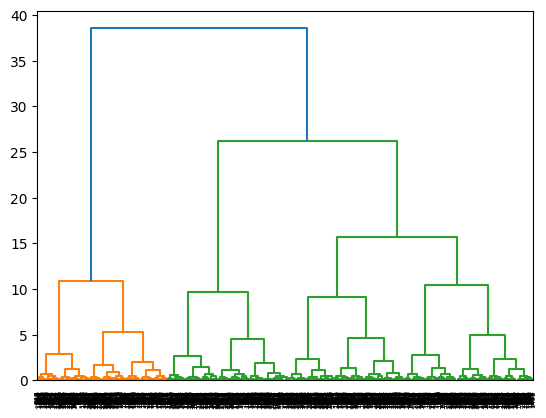

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import pandas as pd
from scipy.cluster.hierarchy import dendrogram
from matplotlib import pyplot as plt


cluster = AgglomerativeClustering(
    n_clusters=None, # 모든 하위 군집이 하나로 묶일 때까지 반복한다
    linkage='ward', # Ward Linkage를 사용한다.
    distance_threshold=0 # Linkage 함수로 나온 값이 이 값보다 클 시 두 군집을 합친다.
                         # 0으로 설정하면 무조건 두 군집을 합치는 것이다.
).fit(MOON)
label = cluster.labels_
children = cluster.children_ # 각 군집이 어떻게 묶여있는지에 대한 정보가 담겨있다.
n_nodes = children.shape[0]
n_samples = len(label)
cnt = np.zeros(n_nodes)

for i, child in enumerate(children):
    cur = 0
    for child_idx in child:
        if child_idx < n_samples:
            cur += 1 # 잎 노드임을 의미한다.
        else:
            cur += cnt[child_idx - n_samples]
        cnt[i] = cur

mat = np.column_stack([
    children, cluster.distances_, cnt
]).astype(float)


dendrogram(mat)
plt.show()

위 그림의 임의의 높이에서 자르게 되면 원하는 군집수가 나오는 것이다. 대충 9 지점에서 끊게 되면 8개의 군집이 나오게 된다. 어떻게 군집이 형성될 지 확인해보자.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import pandas as pd


plots = []
for k in [2, 8]:
    label = AgglomerativeClustering(
        n_clusters=k,
        linkage='ward'
    ).fit_predict(MOON)
    df_result = MOON.assign(
        cluster=label
    )
    p = alt.Chart(df_result).mark_point(
        filled=True, opacity=0.5, size=50
    ).encode(
        x='x1', y='x2', color='cluster:N'
    ).properties(
        title=f'k = {k}',
        width=300,
        height=300
    )
    plots.append(p)

alt.hconcat(*plots)

alt.HConcatChart(...)

# Divisive Clustering: Bisecting K-Means

다음은 Top-Down 방식으로 군집을 분할해가는 Bisecting K-Means를 해보겠다. [sklearn.cluster.BisectingKMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans)에 구현되어 있으며, 기본 [sklearn.cluster.KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) 구현체와 한 옵션을 빼고는 거의 동일하다. 바로 **bisecting_strategy**이다. Agglromerative Clustering의 Linkage는 두 군집을 합치는 규칙에 대한 것이었다면, Bisecting Strategy는 두 군집으로 분할할 군집을 선택하는 규칙에 대한 것이다. 다음과 같이 두 가지 방법이 있다:
* **biggest_inertia**: 관성 값이 가장 큰 군집을 선택한다.
* **largest_cluster**: 샘플 수가 가장 많은 군집을 선택한다.

두 방법 모두 비교해보자.

In [ ]:
from sklearn.cluster import BisectingKMeans
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for bisecting_strategy in ['biggest_inertia', 'largest_cluster']:
        cluster = BisectingKMeans(
            n_clusters=5, # 5개의 군집을 만든다.
            init='k-means++', # K-Means++ 알고리즘을 적용해서 초기 군집 중심을 선택한다.
            n_init=1, # K-Means++ 라면 굳이 여러번 군집 중심을 뽑을 필요가 없으니 1로 바꾸자.
            tol=1e-4, # 이전 단계의 관성값과의 차이가 이 값보다 낮다면 종료한다.
            max_iter=500, # 최대 반복 횟수를 의미한다.
            bisecting_strategy=bisecting_strategy,
            random_state=42
        ).fit(data)
        label = cluster.predict(data)
        df_result = data.assign(
            cluster=label
        )
        df_centroid = pd.DataFrame(cluster.cluster_centers_, columns=['x1', 'x2'])
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=f'{name} (bisecting_strategy = {bisecting_strategy})'
        )
        p_centroid = alt.Chart(df_centroid).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
        ).encode(
            x='x1', y='x2'
        )
        p = (p_result + p_centroid).properties(
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:2]),
    alt.hconcat(*plots[2:4]),
    alt.hconcat(*plots[4:6]),
    alt.hconcat(*plots[6:8])
)

alt.VConcatChart(...)

# DBSCAN
다음은 샘플들이 위치한 지역의 밀도를 기반으로 하는 DBSCAN 군집화를 해보자. [sklearn.cluster.DBSCAN](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html#sklearn.cluster.DBSCAN)에 구현되어 있다.

In [ ]:
from sklearn.cluster import DBSCAN
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    label = DBSCAN(
        eps=0.1, # 서로 이웃하는 샘플을 판정하기 위한 최대 범위
        min_samples=5 # 핵심 샘플로 판정되기 위한 최소 샘플 수
    ).fit_predict(data)
    df_result = data.assign(
        cluster=label
    )
    p_result = alt.Chart(df_result).mark_point(
        filled=True, opacity=0.5, size=50
    ).encode(
        x='x1', y='x2', color='cluster:N'
    ).properties(
        title=f'{name}'
    )
    p = p_result.properties(
        width=300,
        height=300
    )
    plots.append(p)

alt.hconcat(*plots)

alt.VConcatChart(...)

보다시피 Moon 이나 Donut과 같은 데이터에 대해서 K-Means와 다르게 아름다운 군집(?)을 형성했음을 알 수 있다. 하지만, 이러한 결과는 **eps** 나 **min_samples** 값에 따라 굉장히 달라질 수 있다. 다음과 같이 비교해보자.

In [ ]:
from sklearn.cluster import DBSCAN
import pandas as pd
import numpy as np


plots = []

for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for eps, min_samples in [
        (0.1, 5), (0.05, 3), (0.2, 5), (0.05, 7)
    ]:
        label = DBSCAN(
            eps=eps,
            min_samples=min_samples
        ).fit_predict(data)
        df_result = data.assign(
            cluster=label
        )
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        ).properties(
            title=f'{name} (eps = {eps:.2f}, min_samples = {min_samples})'
        )
        p = p_result.properties(
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)

이처럼 초매개변수 설정에 따라 군집화 결과가 완전히 달라질 수 있다. 이러한 점이 DBSCAN의 단점이며, 이를 개선해서 (수업 시간에 다루지 않았지만) **eps**값을 설정하지 않아도 되는 Hierachical DBSCAN (HDBSCAN)이 역시 scikit-learn에 [sklearn.cluster.HDBSCAN](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.HDBSCAN.html#sklearn.cluster.HDBSCAN)으로 구현되어 있다.  궁금한 학생은 직접 해보도록 하자.

# Gaussian Mixture Model
마지막으로는 여러 개의 Gaussian Distribution을 선형 조합해서 데이터를 나타내는 모델인 Gaussian Mixture Model를 사용해보자. 사실, 이 방법은 군집화 방법이라기 보다는 확률적 회귀 모델이므로 [sklearn.cluster](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.cluster) 모듈이 아닌 [sklearn.mixture.GaussianMixture](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html#sklearn.mixture.GaussianMixture)에 구현되어 있다. 어찌되었든 간에, 사용 방법은 거의 대동소이하다.

In [ ]:
from sklearn.mixture import GaussianMixture
import pandas as pd


plots = []
for name, data in zip(
    ['Blobs', 'Moon', 'Donut', 'No Structure'],
    [BLOBS, MOON, DONUT, NO_STRUCT]
):
    for covariance_type in ['full', 'tied', 'diag', 'spherical']:
        cluster = GaussianMixture(
            n_components=5, # 5개의 Gaussian Distribution을 추정한다.
            init_params='k-means++', # 초기 평균 값을 설정하는 방법을 의미한다.
                                     # K-Means++에서 하는 방식대로, 서로 다른 분포의 평균이 멀리 떨어지도록 한다.
        ).fit(data)
        label = cluster.predict(data)
        df_result = data.assign(
            cluster=label
        )
        df_mean = pd.DataFrame(cluster.means_, columns=['x1', 'x2'])
        p_result = alt.Chart(df_result).mark_point(
            filled=True, opacity=0.5, size=50
        ).encode(
            x='x1', y='x2', color='cluster:N'
        )
        p_mean = alt.Chart(df_mean).mark_point(
            filled=True, shape='cross', angle=45, size=300, opacity=1.0, color='black'
        ).encode(
            x='x1', y='x2'
        )
        p = (p_result + p_mean).properties(
            title=f'{name} (covariance_type = {covariance_type})',
            width=300,
            height=300
        )
        plots.append(p)

alt.vconcat(
    alt.hconcat(*plots[:4]),
    alt.hconcat(*plots[4:8]),
    alt.hconcat(*plots[8:12]),
    alt.hconcat(*plots[12:16])
)

alt.VConcatChart(...)